In [1]:
import sys
import os
import numpy as np
import cv2
import torch
import torch.nn.functional as F

from tqdm import tqdm
import dask.array as da

import omnialigner as om
from omnialigner.omni_3D import Omni3D
from omnialigner.plotting.matplotlib_init import plt

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
om_data = Omni3D(config_info="../config/panlab/config_pdac.yaml")
overwrite_cache = False
zoom_level = 3

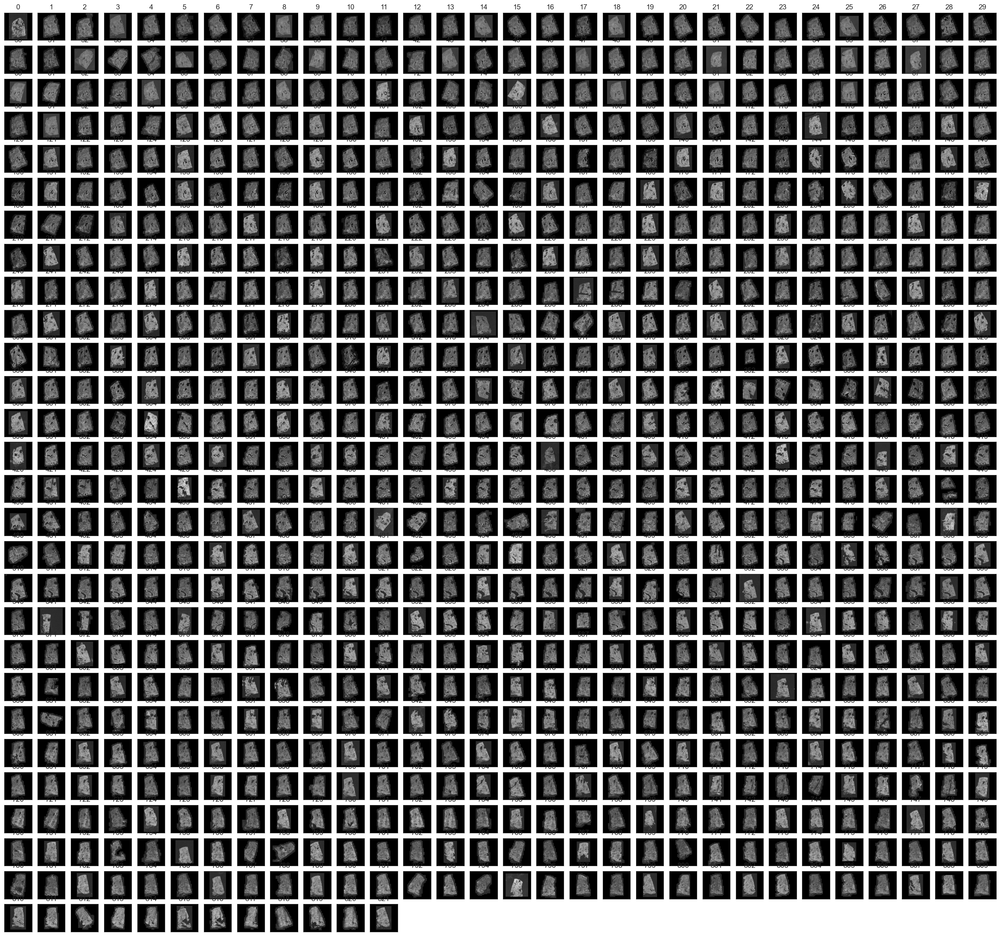

In [4]:
om_data.set_tag("gray")

padded_tensor = om.pp.pad(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="PAD")


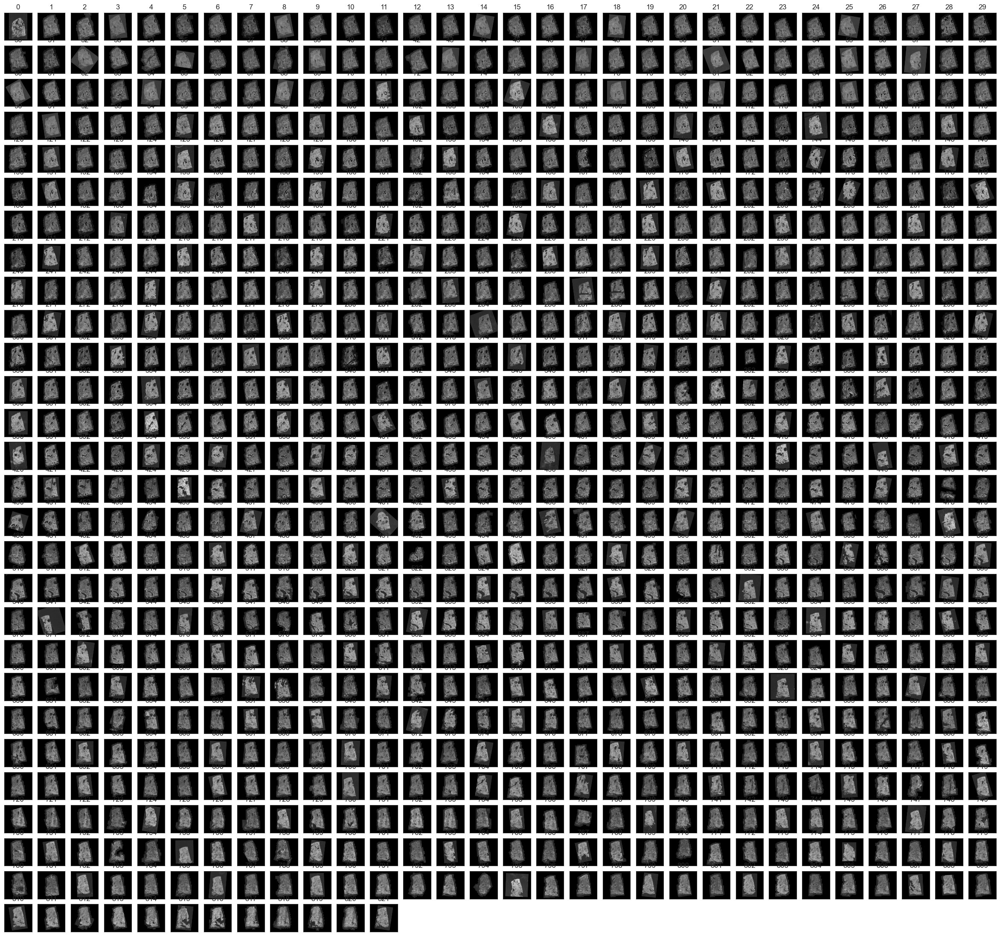

In [5]:
stacked_tensor, l_kpts_pairs_interval = om.align.stack(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="STACK")

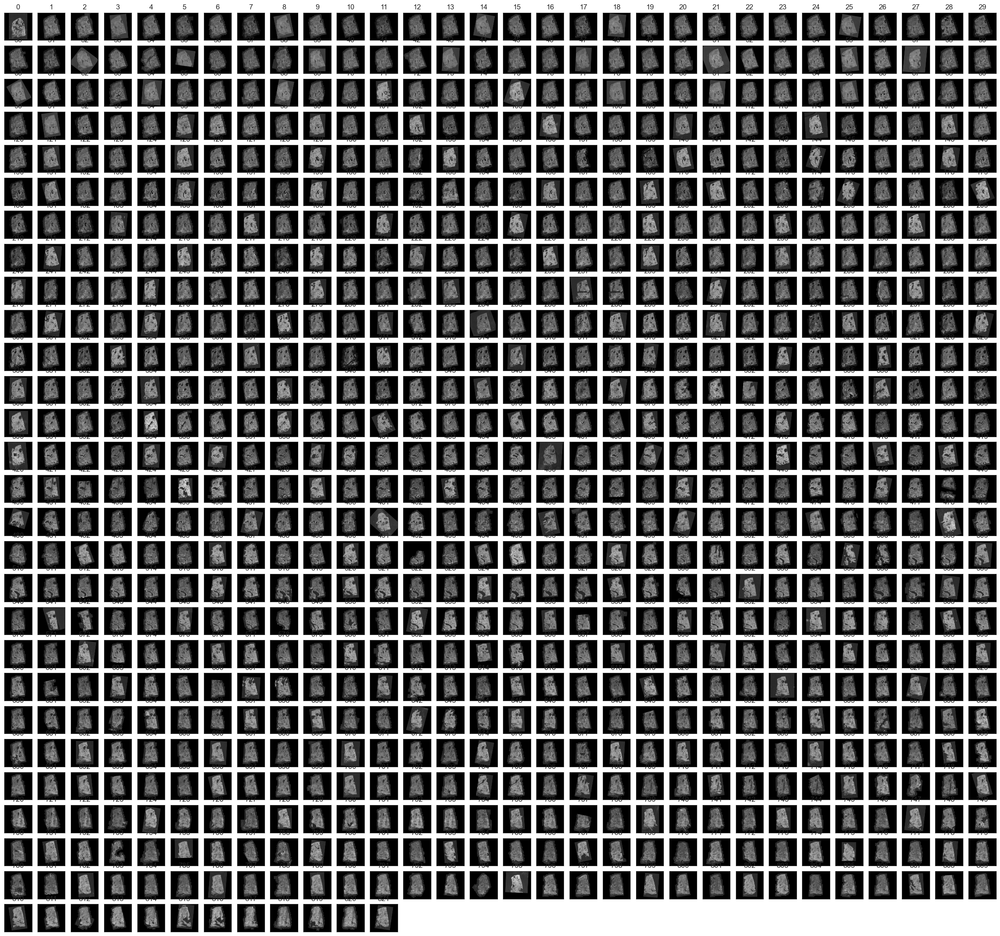

In [6]:
aligned_tensor, l_kpts_moved = om.align.affine(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="AFFINE")

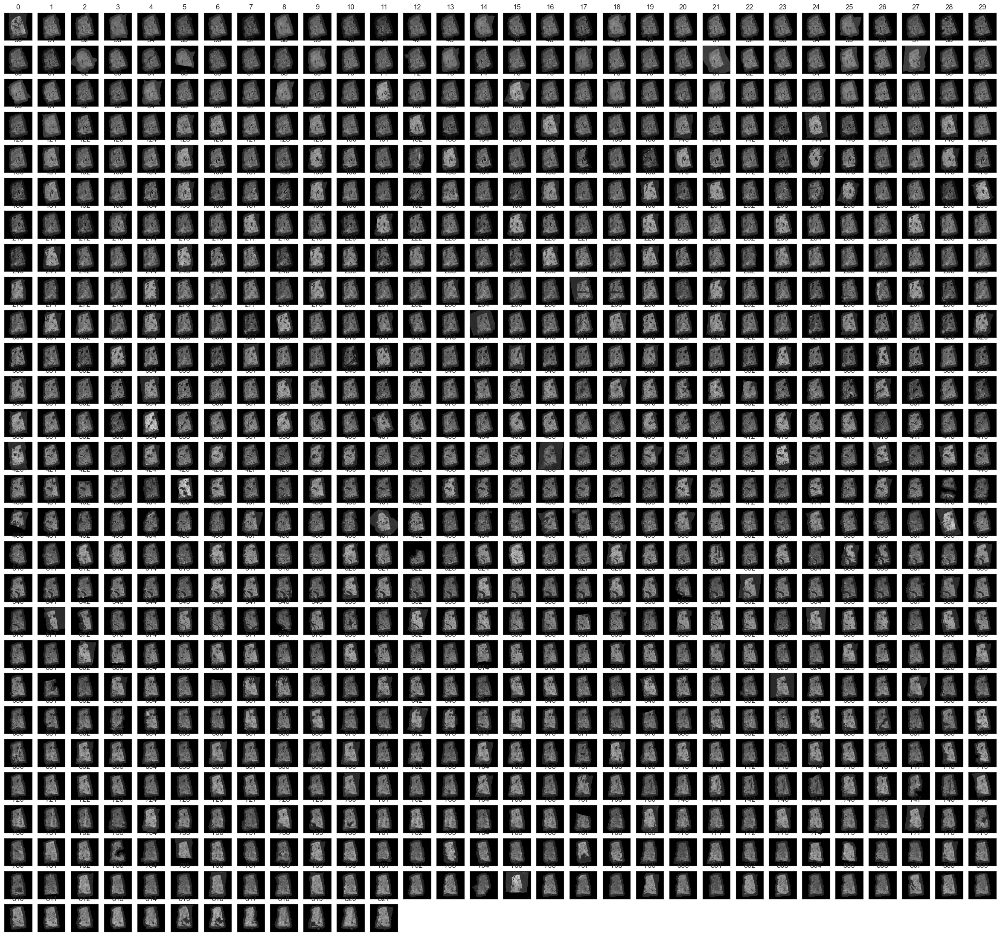

In [7]:
l_kpts_moved, aligned_tensor = om.align.nonrigid(om_data, overwrite_cache=overwrite_cache)
om.pl.plot_nchw_2d(om_data, aligned_tag="NONRIGID")

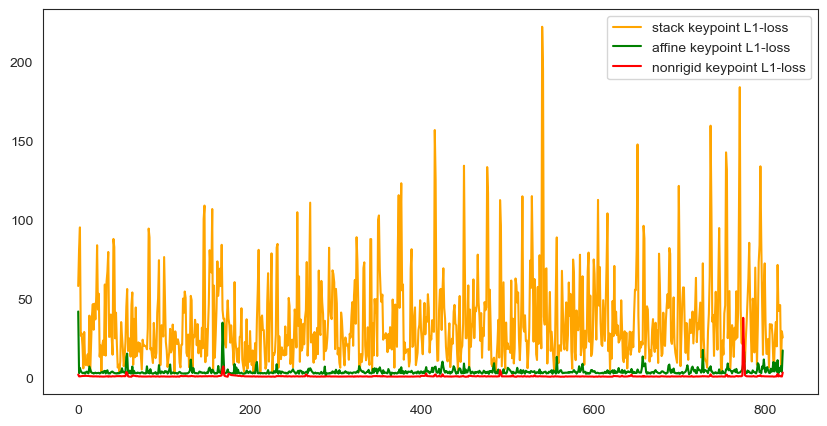

In [8]:
from omnialigner.cache_files import StageTag

func_loss = lambda pair : torch.mean(torch.abs((pair[0] - pair[1])))
dict_file_name = StageTag.STACK.get_file_name(om_data.proj_info)
l_kpts = torch.load(dict_file_name["l_kpts_pairs"])
loss_kpts_stack = []
for idx_F in range(len(l_kpts)):    
    loss_kpts_stack.append(func_loss(l_kpts[idx_F]))

func_loss = lambda pair : torch.mean(torch.abs((pair[0]*om_data.max_size - pair[1]*om_data.max_size)))
dict_file_name = StageTag.AFFINE.get_file_name(om_data.proj_info)
l_kpts_affine = torch.load(dict_file_name["affine_kpts"])
loss_kpts_affine = []
for idx_F in range(len(l_kpts_affine)):    
    loss_kpts_affine.append(func_loss(l_kpts_affine[idx_F][0]))


dict_file_name = StageTag.NONRIGID.get_file_name(om_data.proj_info)
l_kpts_nonrigid = torch.load(dict_file_name["nonrigid_kpts"])
loss_kpts_nonrigid = []
for idx_F in range(len(l_kpts_nonrigid)):
    n_affine = len(l_kpts_affine[idx_F][0][0])
    pair = [l_kpts_nonrigid[idx_F][0][0][0:n_affine], l_kpts_nonrigid[idx_F][0][1][0:n_affine]]
    # loss_kpts_nonrigid.append(func_loss(pair))
    loss_kpts_nonrigid.append(func_loss(l_kpts_nonrigid[idx_F][0]))
    
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.plot(loss_kpts_stack, c="orange", label='stack keypoint L1-loss')
ax1.plot(loss_kpts_affine, c="green", label='affine keypoint L1-loss')
ax1.plot(loss_kpts_nonrigid, c="red", label='nonrigid keypoint L1-loss')
ax1.legend()

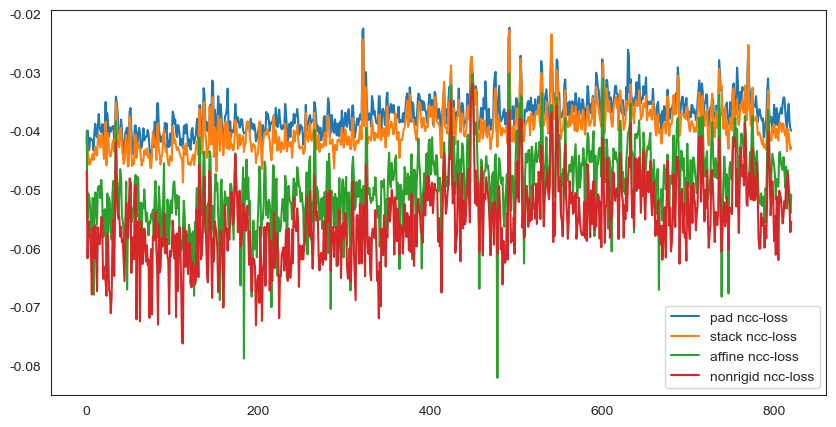

In [9]:

from omnialigner.metrics import ncc_local

dict_loss_img = {}
for stage in [StageTag.PAD, StageTag.STACK, StageTag.AFFINE, StageTag.NONRIGID]: 
    dict_file_name = stage.get_file_name(om_data.proj_info)
    padded_tensor = torch.load(dict_file_name["padded_tensor"])
    loss_img = []
    for idx_F in range(len(padded_tensor)-1):    
        loss_img.append(ncc_local(padded_tensor[idx_F:idx_F+1], padded_tensor[idx_F+1:idx_F+2]))
    dict_loss_img[stage] = loss_img

    
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.plot(dict_loss_img[StageTag.PAD], label='pad ncc-loss')
ax1.plot(dict_loss_img[StageTag.STACK], label='stack ncc-loss')
ax1.plot(dict_loss_img[StageTag.AFFINE], label='affine ncc-loss')
ax1.plot(dict_loss_img[StageTag.NONRIGID], label='nonrigid ncc-loss')
ax1.legend()

### mask

In [10]:
l_images = []
for i_layer in tqdm(range(822)):
    img = om.align.apply_nonrigid_HD(om_data, i_layer=i_layer, tag="MASK")
    l_images.append(img)

np.save("./all_masks.npy", (np.stack(l_images)[:, :, :, 0].compute()/255).astype(np.uint8) )

100%|██████████| 822/822 [09:30<00:00,  1.44it/s]


In [11]:
np_masks = np.load("./all_masks.npy")
l_masks_smoothed = []
for z in tqdm(range(np_masks.shape[0])):
    mean_mask = np_masks[z:min(z+10, np_masks.shape[0]), :, :].mean(0) > (100/255.)
    l_masks_smoothed.append(mean_mask)

np_mask_smoothed = np.array(l_masks_smoothed)
np.save("./all_masks_smoothed.npy", np_mask_smoothed)

100%|██████████| 822/822 [00:10<00:00, 77.80it/s]


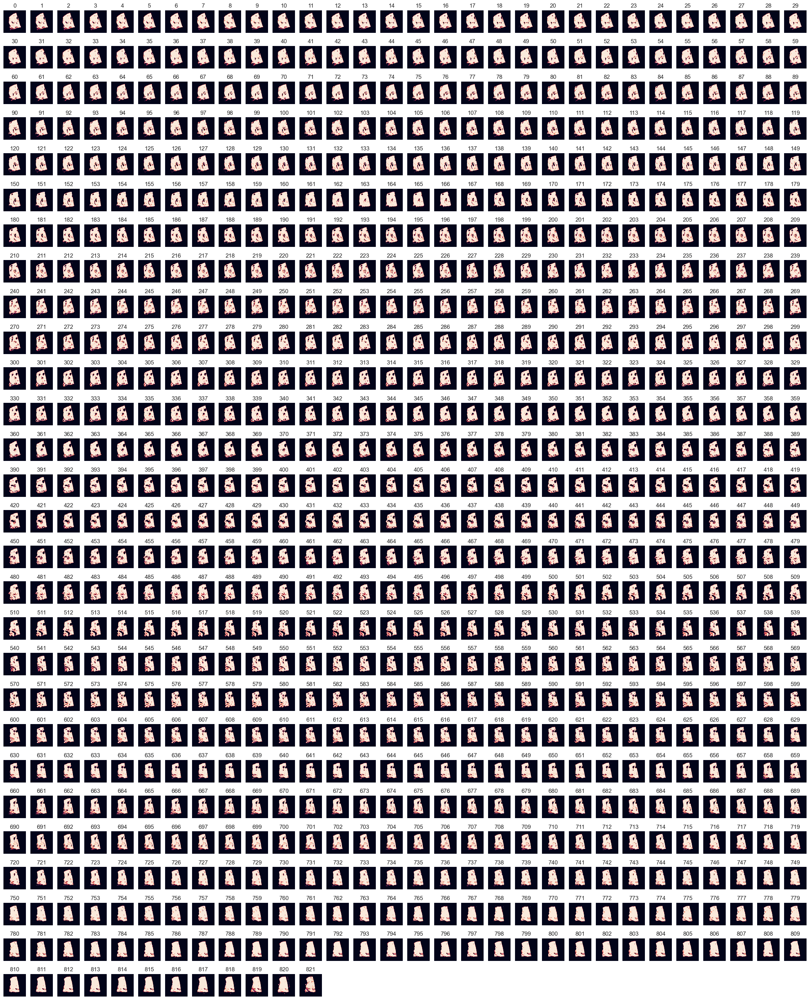

In [12]:
fig = plt.figure(figsize=(30, 40))
for i_layer in range(822):
    ax = fig.add_subplot(30, 30, i_layer+1)
    ax.imshow(np_mask_smoothed[i_layer])
    ax.set_title(i_layer)
    ax.axis('off')
    

100%|██████████| 6/6 [00:00<00:00, 130.29it/s]


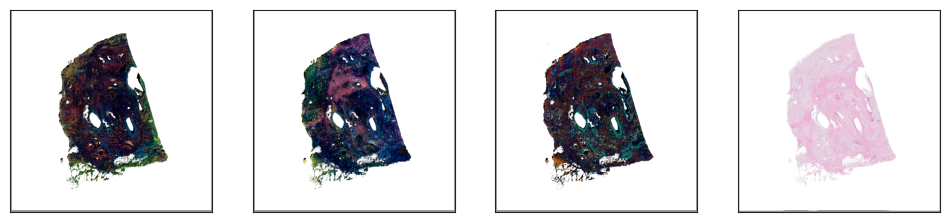

In [ ]:
from omnialigner.plotting.omniplot_3d import apply_colormap_dask
from omnialigner.plotting.pyvista_3d import add_border_to_images

l_rgba_images_4 = []
fig = plt.figure(figsize=(12, 4))
for i,idx in enumerate([1, 2, 4, 3]):
    ax = fig.add_subplot(1, 4, i+1)
    tag = "rmaf"
    if om_data.proj_info.get_dtype(idx) == "HE":
        tag = "raw"
    img = om.align.apply_nonrigid_HD(om_data, i_layer=idx, tag=tag)
    if img.shape[2] != 3:
        img = apply_colormap_dask(img, alpha_enhance=3.)


    img_ = np.zeros([1280, 1280, 4], dtype=np.uint8)
    img_[:, :, 0:3] = img
    img_[:, :, 3] = (255*np_mask_smoothed[idx]).astype(np.uint8)
    img_ = add_border_to_images(img_[None, :, :, :], border_color=np.array([150, 150, 150, 255], dtype=np.uint8))[0]
    ax.imshow(img_)
    ax.axis('off')

    l_rgba_images_4.append(img_)